Unsupervised Malicious DNS to TCP learning

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [2]:
#The DataFrame created from reading the CSV file will have rows and columns, with each row representing a network connection and each column representing a specific attribute of that connection. 
# The values in the DataFrame will correspond to the data extracted from the CSV file.
cols = [ 
        "SourcePort", #Port numbers associated with the source endpoints of the network flow.
        "DestinationPort", #Port numbers associated with the destination endpoints of the network flow.
        "Duration", #Duration of the network flow.
        "FlowBytesSent", #Number of bytes sent in the network flow.
        "FlowSentRate", #Rate at which bytes are sent in the network flow.
        "FlowBytesReceived", #Number of bytes received in the network flow.
        "FlowReceivedRate", #Rate at which bytes are received in the network flow.
        "PacketTimeCoefficientofVariation", #Calculates the coefficient of variation for the time intervals between packets in a data communication or networking context.
        "ResponseTimeTimeVariance", #Calculates the variance of response times in a system or application.
        "ResponseTimeTimeStandardDeviation", #Calculates the standard deviation of response times in a system or application. 
        "ResponseTimeTimeMean",#Calculates the mean (average) of response times in a system or application.
        "ResponseTimeTimeMedian", #Calculates the median of response times in a system or application.
        "ResponseTimeTimeMode", #Calculates the mode of response times in a system or application.
        "ResponseTimeTimeSkewFromMedian",#calculates the skewness of response times in relation to the median in a system or application, where skewness is a statistical measure that indicates the asymmetry of a probability distribution.
        "ResponseTimeTimeSkewFromMode", #Measurement of how the distribution of response times is skewed in relation to the mode which is the most frequently occurring value in a dataset.
        "ResponseTimeTimeCoefficientofVariation", #Useful for understanding how consistent or variable the system's response times are.
        "DoH" #DoH stands for DNS over HTTPS and is a protocol that enhances the security and privacy of DNS (Domain Name System) queries by encrypting the DNS traffic and sending it over the HTTPS protocol.
        ]
df = pd.read_csv("Malicious DNS to TCP.csv",)

In [3]:
df.head()

,SourceIP,DestinationIP,SourcePort,DestinationPort,TimeStamp,Duration,FlowBytesSent,FlowSentRate,FlowBytesReceived,FlowReceivedRate,...,PacketTimeCoefficientofVariation,ResponseTimeTimeVariance,ResponseTimeTimeStandardDeviation,ResponseTimeTimeMean,ResponseTimeTimeMedian,ResponseTimeTimeMode,ResponseTimeTimeSkewFromMedian,ResponseTimeTimeSkewFromMode,ResponseTimeTimeCoefficientofVariation,DoH
0,192.168.20.209,1.1.1.1,39406,443,2020-04-01 22:55:13,120.772871,42357,350.716180,71915,595.456574,...,0.489724,4.023502e-01,0.634311,0.163861,0.001734,0.000006,0.766785,0.258319,3.871039,True
1,1.1.1.1,192.168.20.209,443,39406,2020-04-01 22:57:14,120.656643,78950,654.336123,46138,382.390881,...,0.617101,1.243765e-08,0.000112,0.000050,0.000034,0.000021,0.433249,0.260983,2.225769,True
2,1.1.1.1,192.168.20.209,443,39406,2020-04-01 22:59:15,120.692061,78559,650.904453,46805,387.805127,...,0.617322,8.999716e-09,0.000095,0.000046,0.000031,0.000024,0.471856,0.231073,2.065863,True
3,1.1.1.1,192.168.20.209,443,39406,2020-04-01 23:01:15,120.644016,78133,647.632619,46444,384.967291,...,0.608922,7.678121e-09,0.000088,0.000048,0.000035,0.000021,0.444360,0.307892,1.826318,True
4,1.1.1.1,192.168.20.209,443,39406,2020-04-01 23:03:16,120.883686,79169,654.918812,47193,390.400074,...,0.615777,1.310879e-08,0.000114,0.000048,0.000030,0.000018,0.470369,0.261599,2.387701,True


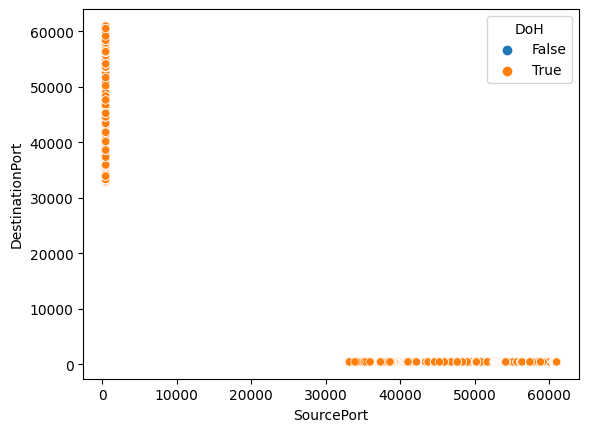

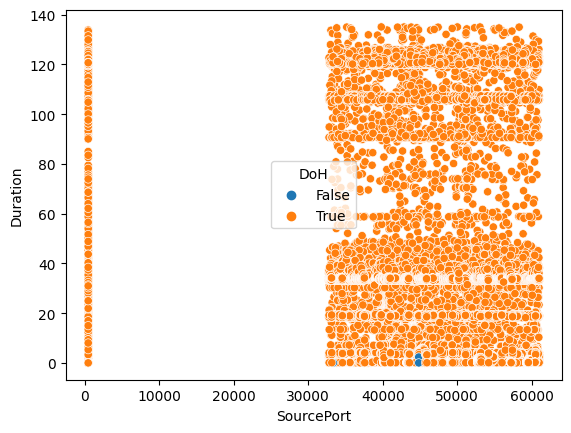

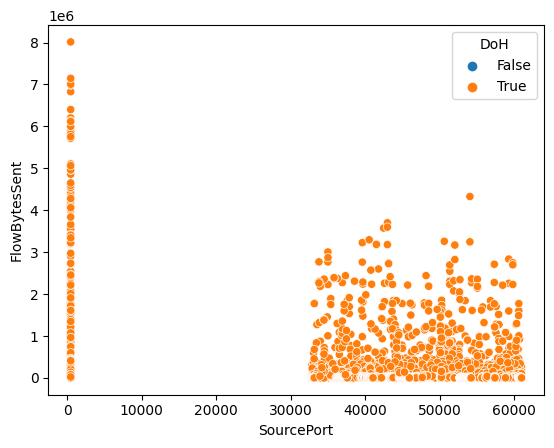

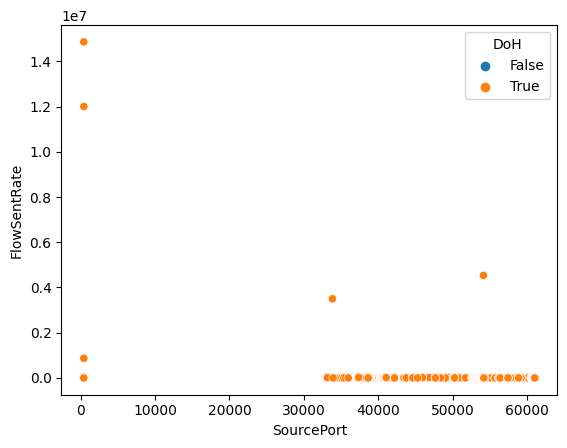

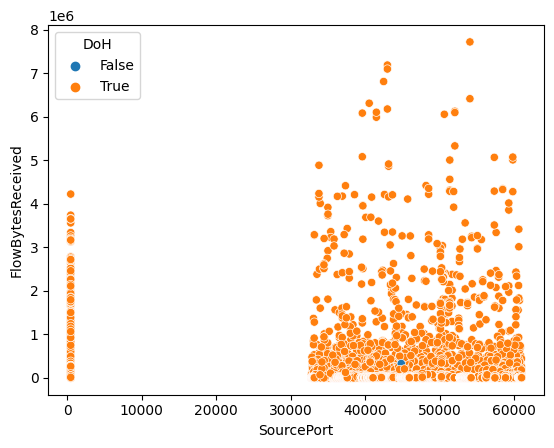

...

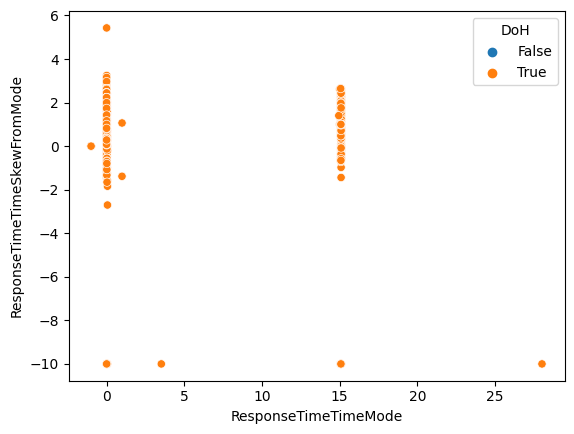

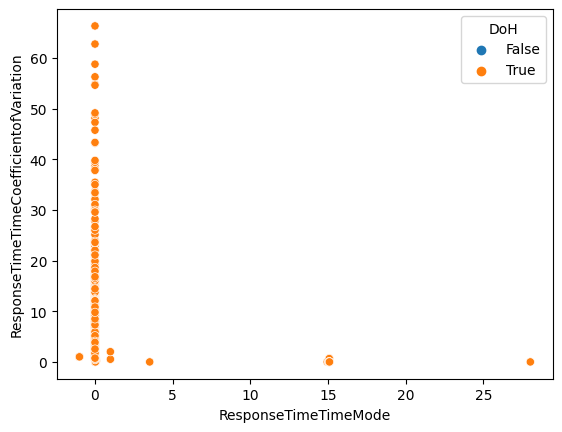

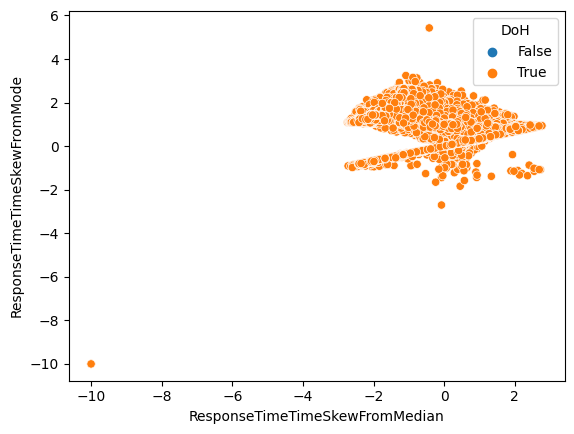

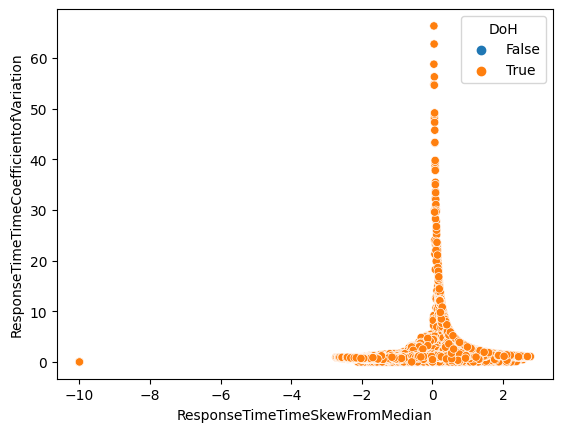

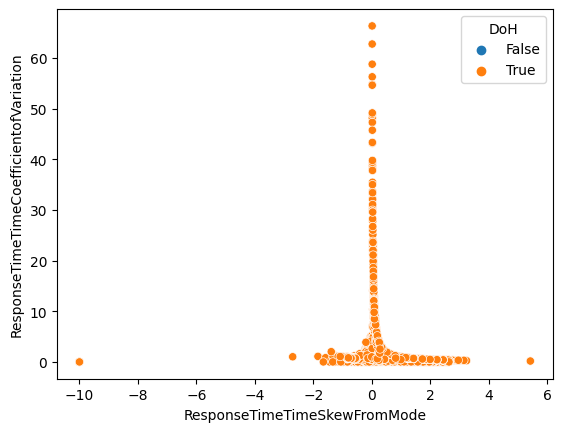

In [4]:
#This code snippet generates scatter plots for pairs of attributes/columns from the DataFrame df.
#It uses Seaborn to create the plots and sets the colors based on the 'DoH' column values, allowing you to visually explore the relationships between different attributes while considering the 'DoH' status. 
#The loop structure ensures that each unique pair of attributes is plotted exactly once.
for i in range(len(cols)-1): 
    for j in range(i+1, len(cols)-1):
        x_label = cols[i]
        y_label = cols[j]
        sns.scatterplot(x=x_label, y=y_label, data=df, hue='DoH') 
        plt.show()

In [5]:
#To create new DataFrame where all the rows containing NaN values have been removed which can be useful in data analysis and visualization tasks because missing data can often interfere with calculations and visualizations.
df = df.dropna()

In [6]:
#These two lines define the variables x and y, assigning them the column names "SourcePort" and "DestinationPort" respectively, as these variables indicate which columns you want to select from the original DataFrame df.
x = "SourcePort"
y = "DestinationPort"
#Creates a new DataFrame X by selecting only the columns specified by the x and y variables from the original DataFrame df, where the [[x, y]] notation is used to create a DataFrame with only the selected columns, and the .values attribute converts the DataFrame to a NumPy array.
X = df[[x, y]].values

In [7]:
#The k-means clustering algorithm groups data points in the dataset X into 3 distinct clusters, which calculates cluster centers and assigns each data point to the nearest cluster. 
#The kmeans object stores the trained model, allowing for predictions of cluster assignments or further analysis.
kmeans = KMeans(n_clusters=3).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [8]:
#Assigns the cluster labels that were generated by the previously trained k-means clustering model (kmeans). 
#Each data point in the dataset has been assigned a label indicating the cluster it belongs to which holds an array or list of these cluster labels, allowing you to analyze and work with the cluster assignments for each data point in your dataset.
clusters = kmeans.labels_

In [9]:
#Combines the original data matrix X with the cluster labels from the clusters array, resulting in an additional column called "class."
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

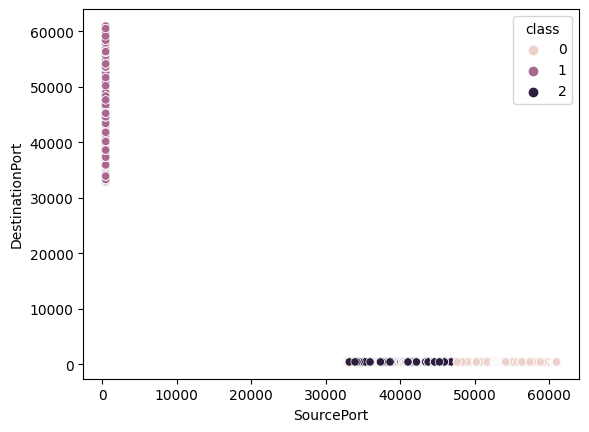

In [10]:
#The resulting plot will show data points scattered across the X and Y axes, with each point's color representing the cluster it belongs to. 
# This visualization can help visually understand how well the k-means clustering algorithm grouped the data points into different clusters based on their characteristics.
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [11]:
pca = PCA(n_components=2) #Initializes the PCA algorithm with the parameter meaning that the PCA will transform the data into a two-dimensional space, capturing the two most significant dimensions of variation in the data.
transformed_x = pca.fit_transform(X) #Applies the PCA transformation to the original dataset, and this method of the PCA model calculates the principal components and transforms the data accordingly. 

#After running this code, transformed_x will contain the dataset X transformed into a lower-dimensional space that retains the most important variations in the data. 
#This reduction can be useful for visualization, analysis, or as input to other machine learning algorithms that perform better with fewer features.

In [12]:
#Used to retrieve the shape of the array X in the context of a NumPy or similar array, to return a tuple representing the dimensions of the array as the elements of this tuple correspond to the size of each dimension.
X.shape



#The below result indicates that the array or dataset has 167,318 rows (data points) and 2 columns (features). 
#This shape suggests that this is a two-dimensional dataset where each row corresponds to a data point and each column represents a different feature or attribute associated with that data point.

(167318, 2)

In [13]:
#This indicates that PCA reduced the original dataset's dimensionality from the original number of features to only 2 principal components, which capture the most important variations in the data.
transformed_x.shape

(167318, 2)

In [14]:
#Retrieves the first five rows (data points) of the transformed dataset.
transformed_x[:5]

#Each row represents a data point in a two-dimensional space resulting from the principal component analysis (PCA) transformation, providing a glimpse into how the data has been projected into the reduced-dimensional space.
#The first row [2995.89873934, -4965.78860134] indicates that the original data point has been transformed into a point with coordinates. 

array([[ 2995.89873934, -4965.78860134],
       [57503.84228904,  3103.58733398],
       [57503.84228904,  3103.58733398],
       [57503.84228904,  3103.58733398],
       [57503.84228904,  3103.58733398]])

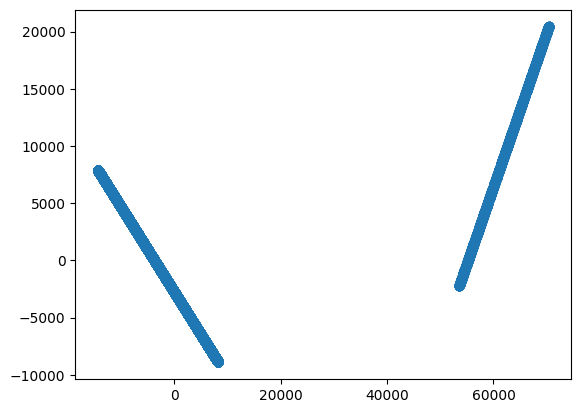

In [15]:
plt.scatter(transformed_x[:,0], transformed_x[:,1]) #Generates a scatter plot using the first column of transformed_x as the X coordinates and the second column as the Y coordinates to represent a data point in the reduced-dimensional space created by PCA.
plt.show()

#The resulting plot will show data points scattered across the two-dimensional space with each point's position indicating its transformed coordinates after PCA. 
#This visualization can help with the understanding of the distribution and relationships between data points in the reduced-dimensional space.

In [16]:
#Creates a DataFrame named kmeans_pca_df by combining the transformed PCA data transformed_x with the cluster labels from the k-means clustering model.
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [17]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))), #Horizontally stacks the transformed PCA data transformed_x with the cluster labels from the "class" column of the original cluster_df. 
    #The cluster labels are reshaped to have a single column using reshape(-1, 1) to ensure compatibility.
    columns=["pca1", "pca2", "class"]
)

#This DataFrame can be used for comparison, analysis, or visualization purposes to evaluate how well the k-means clustering results match the original cluster assignments.

[]

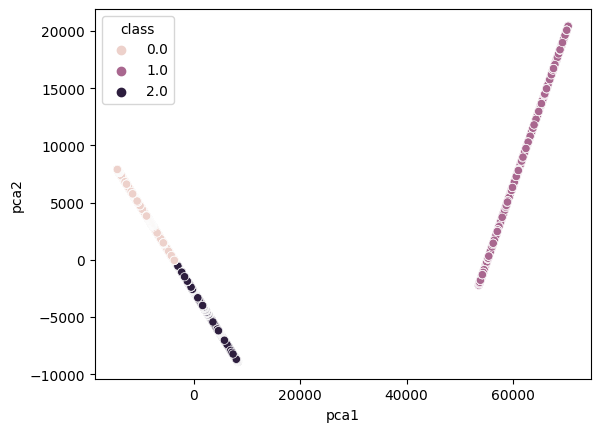

In [18]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

#The resulting plot will show data points scattered across the two-dimensional space defined by the first and second principal components. 
#Each point's color will represent its assigned cluster label based on the k-means clustering results. 
# This visualization helps assess how well the k-means algorithm separated the data points into clusters in the PCA-transformed space.

[]

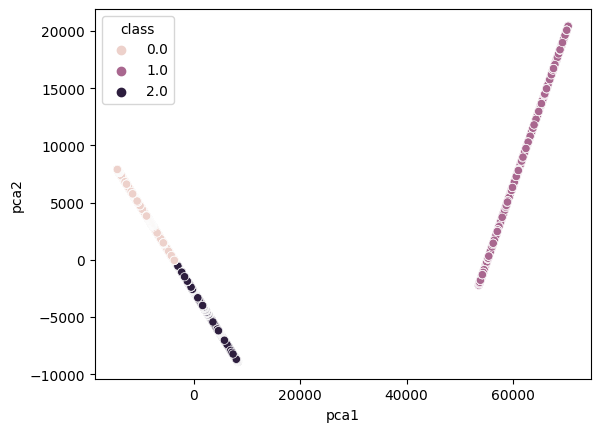

In [19]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()

In [20]:
df = df.dropna()

In [21]:
x = "ResponseTimeTimeVariance"
y = "ResponseTimeTimeStandardDeviation"
X = df[[x, y]].values

In [22]:
kmeans = KMeans(n_clusters=5).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [23]:
clusters = kmeans.labels_

In [24]:
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

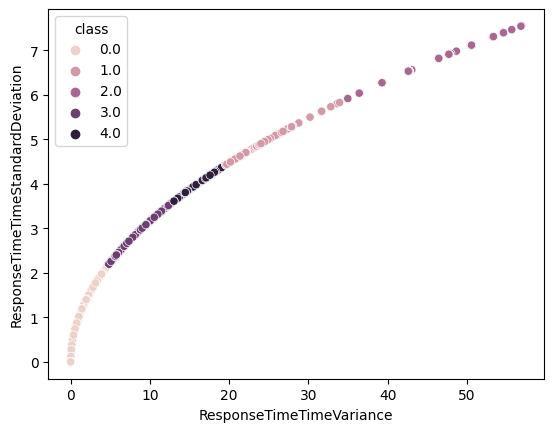

In [25]:
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [26]:
pca = PCA(n_components=2)
transformed_x = pca.fit_transform(X)

In [27]:
X.shape

(167318, 2)

In [28]:
transformed_x.shape

(167318, 2)

In [29]:
transformed_x[:20]

array([[-0.1612864 , -0.4920611 ],
       [-0.66832074,  0.06202419],
       [-0.66832366,  0.06204059],
       [-0.66832493,  0.06204772],
       [-0.66832022,  0.06202127],
       [-0.6683263 ,  0.06205543],
       [-0.66697802,  0.05478226],
       [-0.6671348 ,  0.05559809],
       [-0.66704295,  0.05511927],
       [-0.66700341,  0.05491389],
       [-0.66697259,  0.05475413],
       [-0.66699387,  0.05486445],
       [-0.66703131,  0.05505874],
       [-0.66693038,  0.05453584],
       [-0.66700931,  0.05494452],
       [-0.6669574 ,  0.05467554],
       [-0.66696595,  0.05471977],
       [-0.667133  ,  0.0555887 ],
       [-0.66700954,  0.05494569],
       [-0.66700569,  0.05492572]])

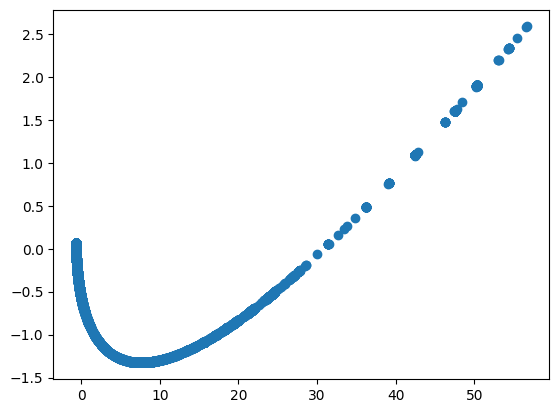

In [30]:
plt.scatter(transformed_x[:,0], transformed_x[:,1])
plt.show()

In [31]:
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [32]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))),
    columns=["pca1", "pca2", "class"]
)

[]

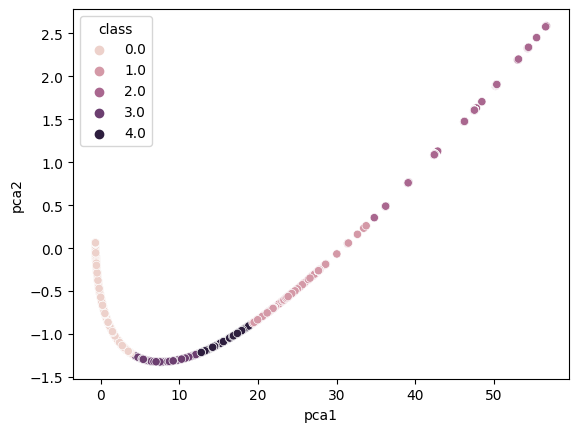

In [33]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

[]

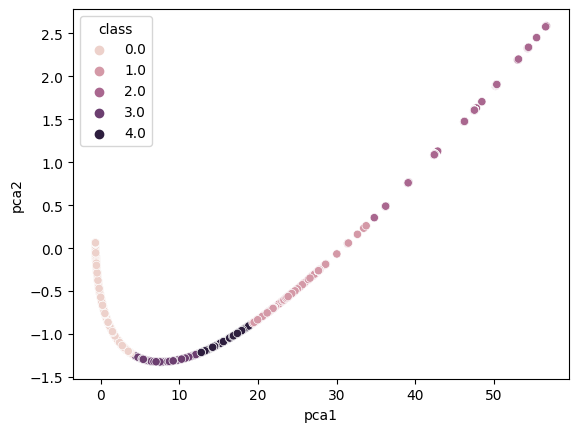

In [34]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()

In [35]:
x = "SourcePort"
y = "FlowBytesReceived"
X = df[[x, y]].values

In [36]:
kmeans = KMeans(n_clusters=5).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [37]:
clusters = kmeans.labels_

In [38]:
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

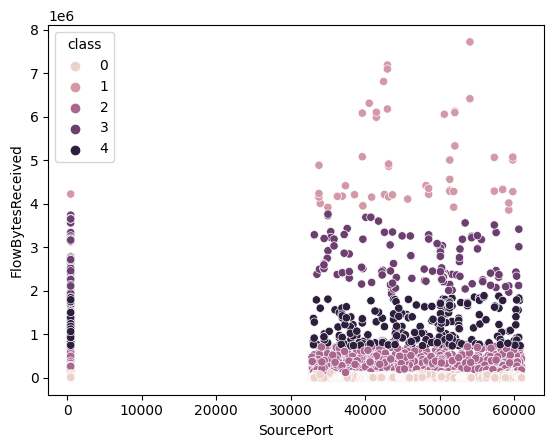

In [39]:
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [40]:
pca = PCA(n_components=2)
transformed_x = pca.fit_transform(X)

In [41]:
X.shape

(167318, 2)

In [42]:
transformed_x[:50]

array([[ 52581.35475169,  -4810.03657892],
       [ 27217.2824379 , -44043.09577212],
       [ 27884.24523969, -44036.05155302],
       [ 27523.26537245, -44039.86409139],
       [ 28272.22360116, -44031.95386635],
       [ -8487.72620329, -44420.19911714],
       [-14607.40871556,   4470.89724967],
       [-14675.51053372,   4480.1785407 ],
       [-14608.10574474,   4536.89356889],
       [-14609.16905526,   4542.88267322],
       [-14541.21509177,   4547.60060142],
       [-14540.25739173,   4551.61093939],
       [-14540.29963592,   4555.61071631],
       [-14541.34182435,   4559.59993218],
       [-14472.38791663,   4564.32842142],
       [-14607.42263195,   4566.90245685],
       [-14539.53203475,   4577.62005043],
       [-14608.57043085,   4580.89111503],
       [-14608.61267505,   4584.89089195],
       [-14540.65871156,   4589.60882015],
       [-14609.69710766,   4592.87988475],
       [-14609.73935185,   4596.87966167],
       [-14607.78170759,   4600.90056069],
       [-14

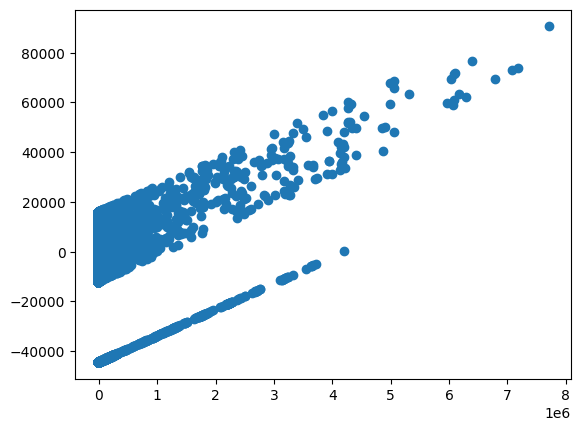

In [43]:
plt.scatter(transformed_x[:,0], transformed_x[:,1])
plt.show()

In [44]:
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [45]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))),
    columns=["pca1", "pca2", "class"]
)

[]

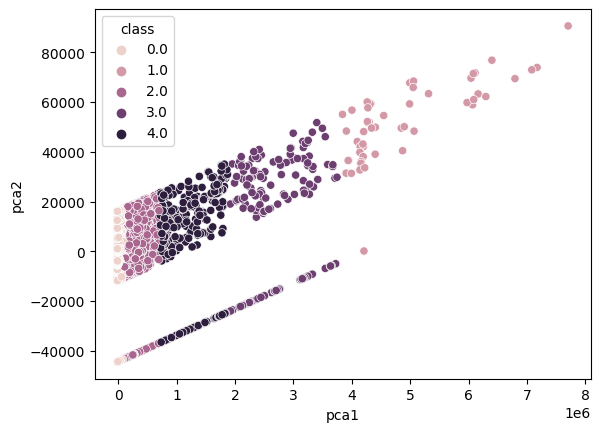

In [46]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

[]

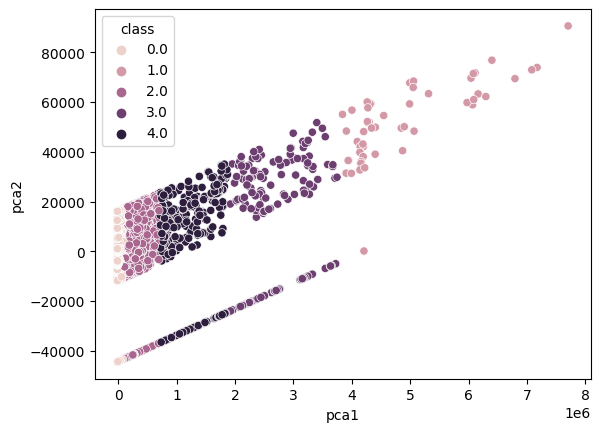

In [47]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()

In [48]:
x = "FlowReceivedRate"
y = "ResponseTimeTimeSkewFromMedian"
X = df[[x, y]].values

In [49]:
kmeans = KMeans(n_clusters=5).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [50]:
clusters = kmeans.labels_

In [51]:
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

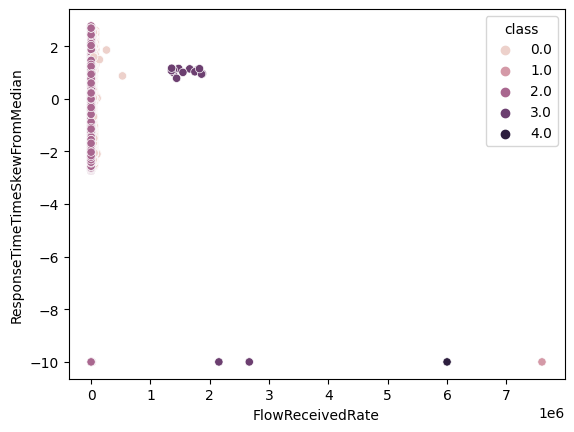

In [52]:
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [53]:
pca = PCA(n_components=2)
transformed_x = pca.fit_transform(X)

In [54]:
X.shape

(167318, 2)

In [55]:
transformed_x[:15]

array([[-2.88676809e+03, -1.43746335e+00],
       [-3.09983378e+03, -1.10372497e+00],
       [-3.09441953e+03, -1.14233684e+00],
       [-3.09725737e+03, -1.11483787e+00],
       [-3.09182459e+03, -1.14085227e+00],
       [-2.92737695e+03, -1.25407617e+00],
       [-3.33904282e+03,  1.69659582e+00],
       [-3.34256973e+03,  9.55020275e-01],
       [-3.34057851e+03,  7.23616598e-01],
       [-3.33779172e+03,  1.32635550e+00],
       [-3.33856102e+03,  1.17209031e+00],
       [-3.33714356e+03,  1.26239589e+00],
       [-3.33557030e+03,  1.34954088e+00],
       [-3.33731556e+03,  1.06529975e+00],
       [-3.33658424e+03,  1.39710303e+00]])

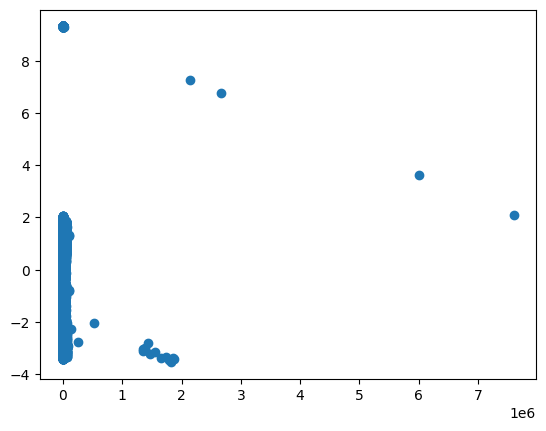

In [56]:
plt.scatter(transformed_x[:,0], transformed_x[:,1])
plt.show()

In [57]:
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [58]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))),
    columns=["pca1", "pca2", "class"]
)

[]

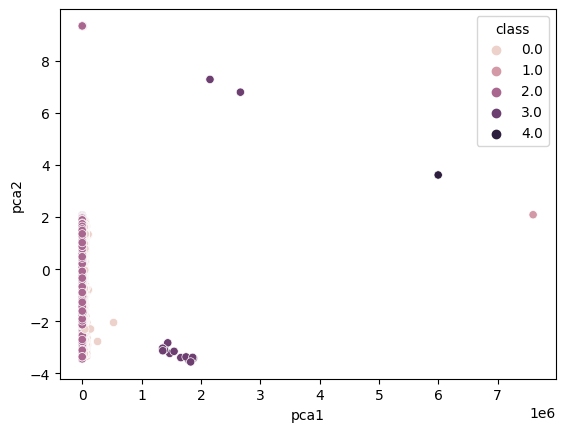

In [59]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

[]

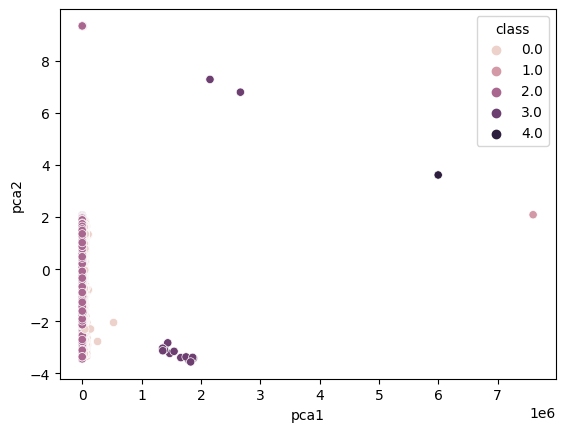

In [60]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()

Unsupervised ML Phishing filter.

In [61]:
cols = [
    'id', 
    'NumDots',
    'SubdomainLevel',
    'PathLevel',
    'UrlLength',
    'NumDash',
    'NumDashInHostname',
    'AtSymbol',
    'TildeSymbol',
    'NumUnderscore',
    'IframeOrFrame',
    'MissingTitle',
    'ImagesOnlyInForm',
    'SubdomainLevelRT',
    'UrlLengthRT',
    'PctExtResourceUrlsRT',
    'AbnormalExtFormActionR',
    'ExtMetaScriptLinkRT',
    'PctExtNullSelfRedirectHyperlinksRT',
    'CLASS_LABEL'
]

df = pd.read_csv("Phishing.csv",)

In [62]:
df.head()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,...,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,...,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,...,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,...,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,...,1,0,0,1,1,-1,0,-1,-1,1


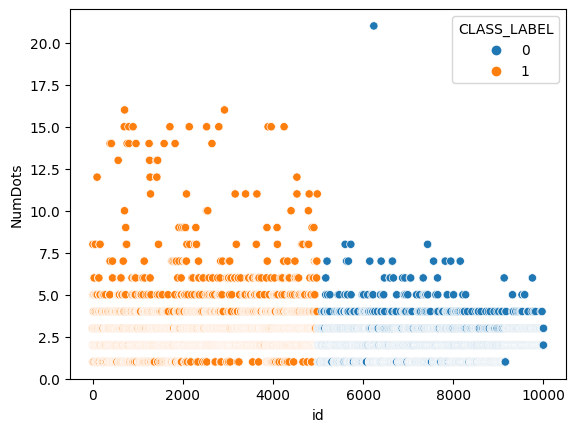

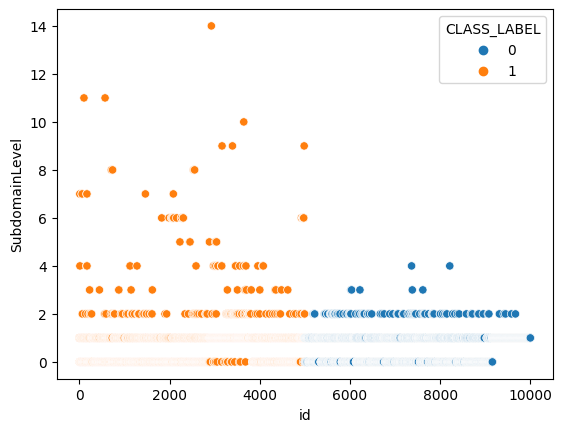

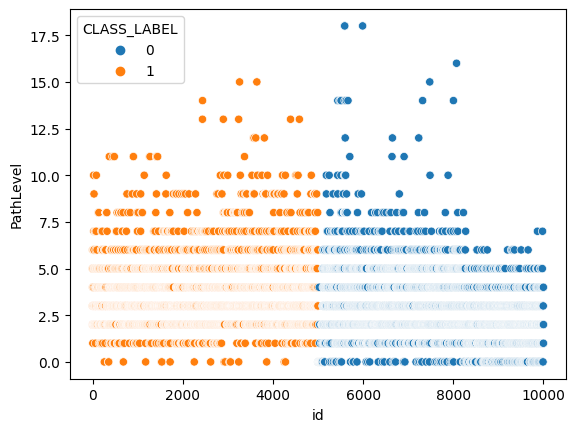

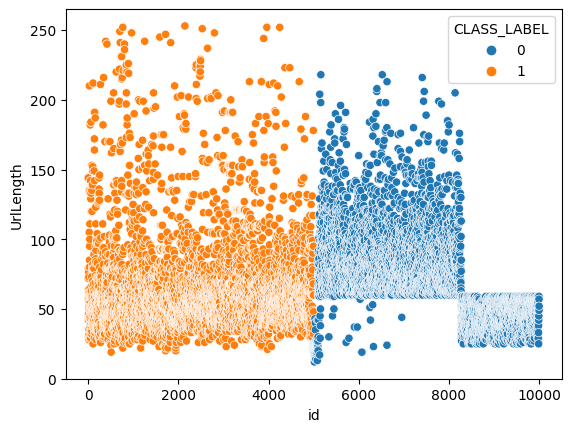

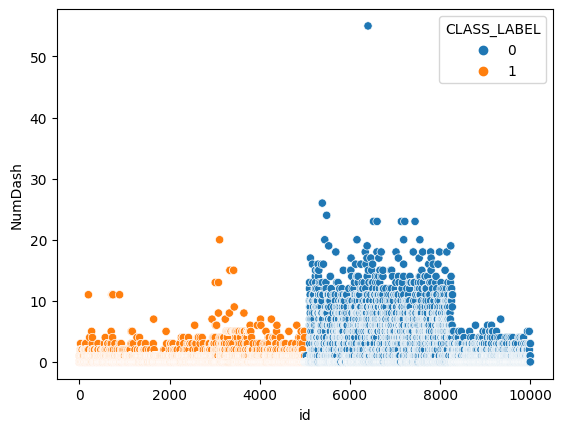

...

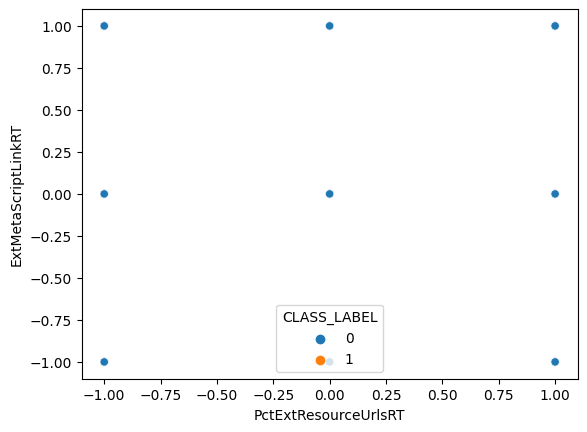

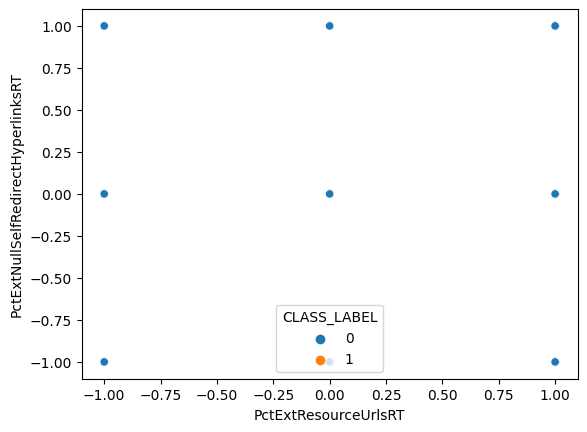

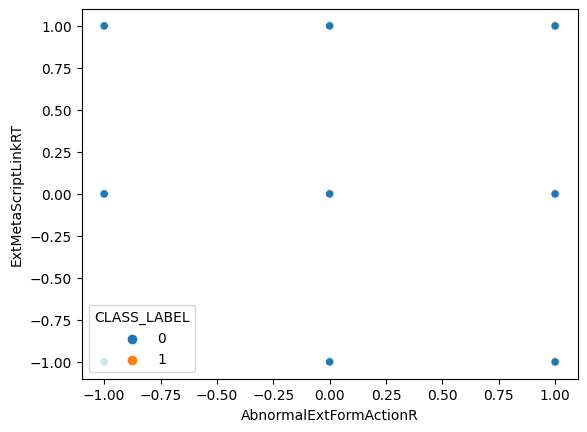

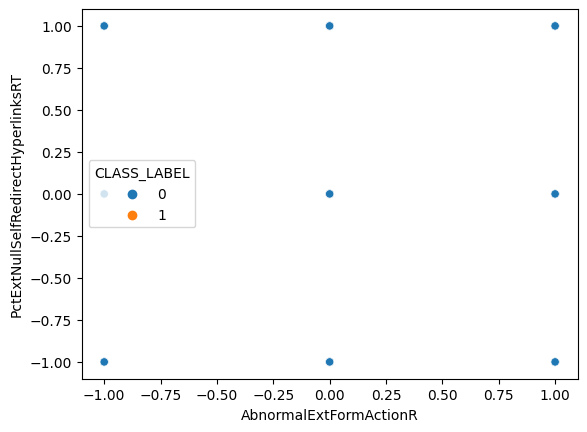

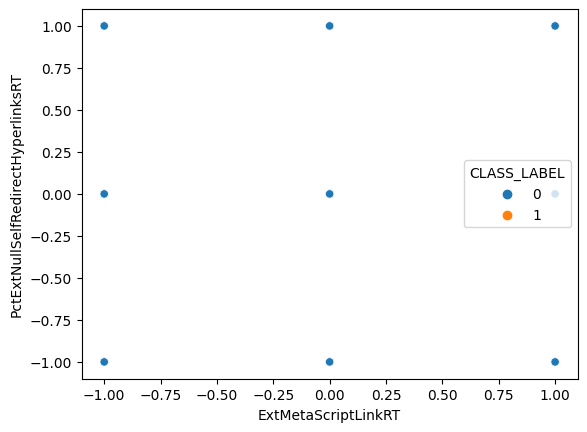

In [63]:
for i in range(len(cols)-1): 
    for j in range(i+1, len(cols)-1):
        x_label = cols[i]
        y_label = cols[j]
        sns.scatterplot(x=x_label, y=y_label, data=df, hue='CLASS_LABEL') 
        plt.show()

In [64]:
df = df.dropna()

In [65]:
x = "UrlLength"
y = "NumDash"
X = df[[x, y]].values

In [66]:
kmeans = KMeans(n_clusters=3).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [67]:
clusters = kmeans.labels_

In [68]:
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

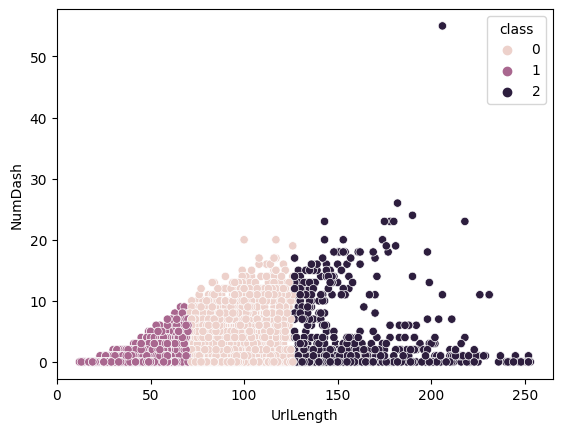

In [69]:
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [70]:
pca = PCA(n_components=2)
transformed_x = pca.fit_transform(X)

In [71]:
X.shape

(10000, 2)

In [72]:
transformed_x.shape

(10000, 2)

In [73]:
transformed_x[:15]

array([[  1.65997792,  -1.88757678],
       [ 73.59955458,  -4.83669707],
       [-12.32827309,  -1.31413673],
       [  8.69506343,  -1.17513602],
       [-24.31820254,  -0.82261668],
       [-28.27388568,   0.34038413],
       [-10.32995152,  -1.39605673],
       [-40.30477513,  -0.16725661],
       [  5.69758107,  -1.05225601],
       [-24.31820254,  -0.82261668],
       [ -6.29234837,  -0.56073596],
       [-23.31904175,  -0.86357668],
       [ -9.28983073,  -0.43785595],
       [-35.30897119,  -0.37205663],
       [-10.28899152,  -0.39689595]])

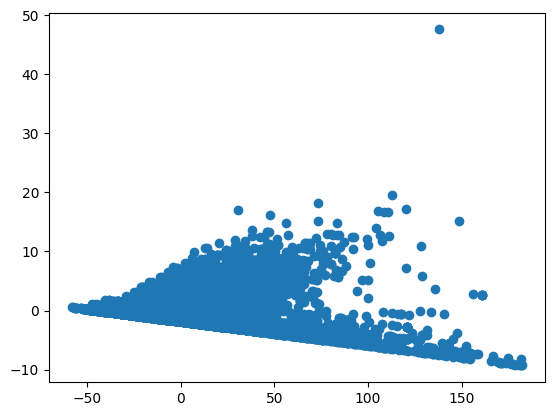

In [74]:
plt.scatter(transformed_x[:,0], transformed_x[:,1])
plt.show()

In [75]:
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [76]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))),
columns=["pca1", "pca2", "class"]
)

[]

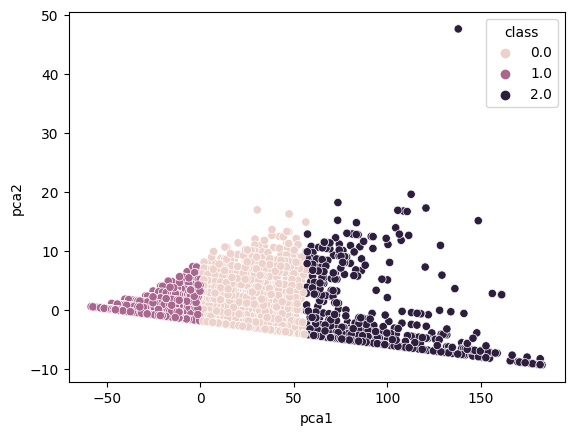

In [77]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

[]

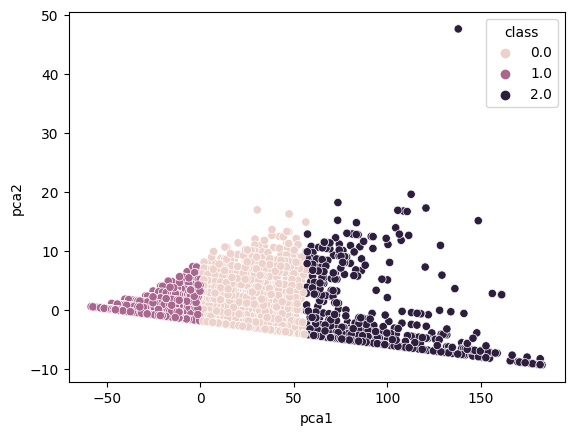

In [78]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()


In [79]:
df = df.dropna()

In [80]:
x = "NumDots"
y = "SubdomainLevel"
X = df[[x, y]].values

In [81]:
kmeans = KMeans(n_clusters=3).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [82]:
clusters = kmeans.labels_

In [83]:
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

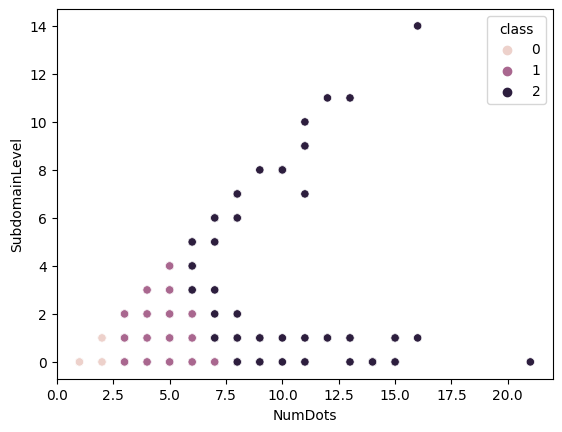

In [84]:
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [85]:
pca = PCA(n_components=2)
transformed_x = pca.fit_transform(X)

In [86]:
X.shape

(10000, 2)

In [87]:
transformed_x.shape

(10000, 2)

In [88]:
transformed_x[:20]

array([[ 0.66178029,  0.20173025],
       [ 0.66178029,  0.20173025],
       [ 0.66178029,  0.20173025],
       [ 0.66178029,  0.20173025],
       [ 0.3243561 , -0.73962245],
       [ 0.66178029,  0.20173025],
       [-0.6169966 , -0.40219826],
       [-1.55834931, -0.06477407],
       [ 7.39308896,  4.16272554],
       [-0.6169966 , -0.40219826],
       [ 3.55675827,  2.35093999],
       [-0.6169966 , -0.40219826],
       [-0.27957241,  0.53915444],
       [-0.27957241,  0.53915444],
       [-0.27957241,  0.53915444],
       [ 0.3243561 , -0.73962245],
       [ 0.3243561 , -0.73962245],
       [ 0.66178029,  0.20173025],
       [-0.6169966 , -0.40219826],
       [-1.55834931, -0.06477407]])

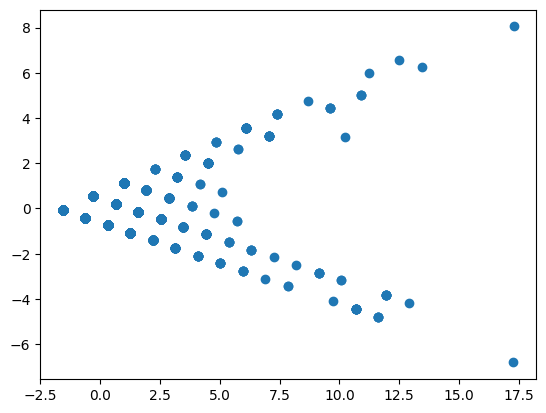

In [89]:
plt.scatter(transformed_x[:,0], transformed_x[:,1])
plt.show()

In [90]:
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [91]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))),
columns=["pca1", "pca2", "class"]
)

[]

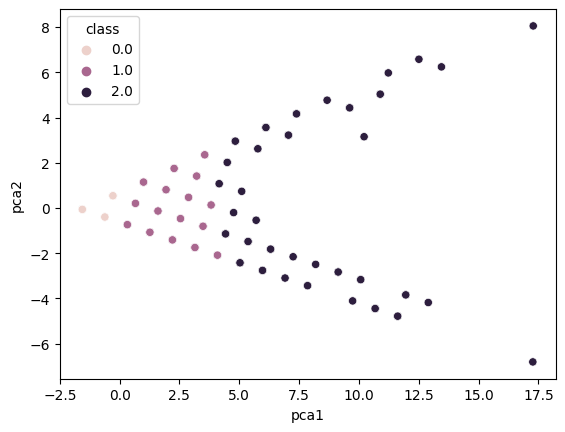

In [92]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

[]

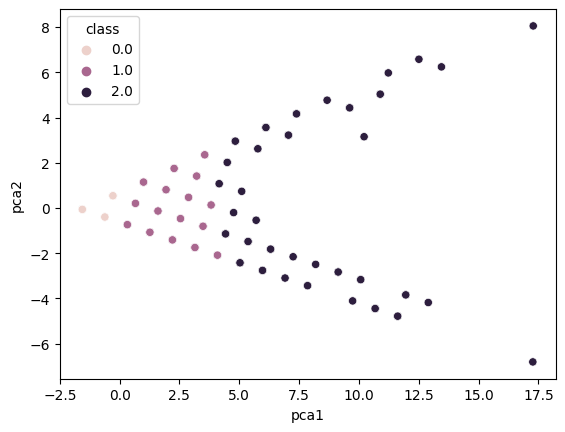

In [93]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()

In [94]:
df = df.dropna()

In [95]:
y = "SubdomainLevelRT"
x = "UrlLength"
X = df[[x, y]].values

In [96]:
kmeans = KMeans(n_clusters=20).fit(X)

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [97]:
clusters = kmeans.labels_

In [98]:
cluster_df = pd.DataFrame(np.hstack((X, clusters.reshape(-1, 1))), columns=[x, y, "class"])

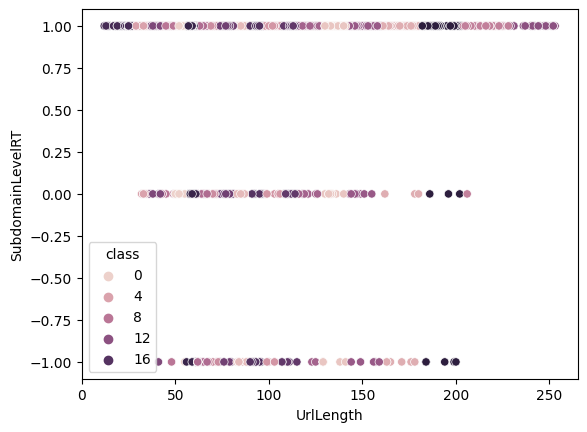

In [99]:
sns.scatterplot(x=x, y=y, hue='class', data=cluster_df)
plt.show()

In [100]:
pca = PCA(n_components=2)
transformed_x = pca.fit_transform(X)

In [101]:
X.shape

(10000, 2)

In [102]:
transformed_x[:20]

array([[ 1.73585607e+00, -4.51230323e-02],
       [ 7.37358206e+01, -1.16590205e-01],
       [-1.22641370e+01, -3.12266377e-02],
       [ 8.73585262e+00, -5.20712296e-02],
       [-2.42641311e+01, -1.93154423e-02],
       [-2.82641292e+01, -1.53450438e-02],
       [-1.02641380e+01, -3.32118369e-02],
       [-4.02641232e+01, -3.43384840e-03],
       [ 5.73783929e+00,  1.95090558e+00],
       [-2.42641311e+01, -1.93154423e-02],
       [-6.26215479e+00,  1.96281678e+00],
       [-2.32641316e+01, -2.03080419e-02],
       [-9.26413852e+00, -3.42044365e-02],
       [-3.52641257e+01, -8.39684648e-03],
       [-1.02641380e+01, -3.32118369e-02],
       [ 2.73585557e+00, -4.61156319e-02],
       [-2.02641331e+01, -2.32858407e-02],
       [-1.12641375e+01, -3.22192373e-02],
       [-4.22641223e+01, -1.44864916e-03],
       [-1.12641375e+01, -3.22192373e-02]])

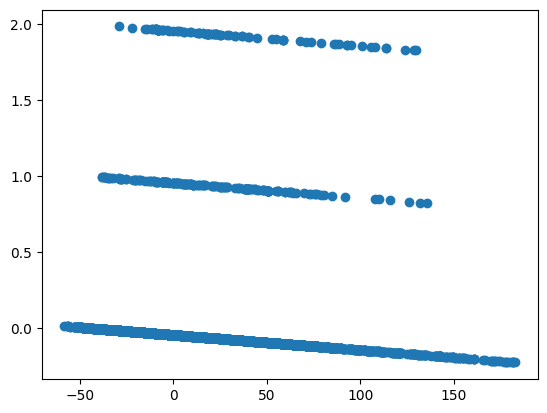

In [103]:
plt.scatter(transformed_x[:,0], transformed_x[:,1])
plt.show()

In [104]:
kmeans_pca_df = pd.DataFrame(np.hstack((transformed_x, kmeans.labels_.reshape(-1, 1))), columns=["pca1", "pca2", "class"])

In [105]:
truth_pca_df = pd.DataFrame(
    np.hstack((transformed_x, cluster_df["class"].values.reshape(-1, 1))),
columns=["pca1", "pca2", "class"]
)

[]

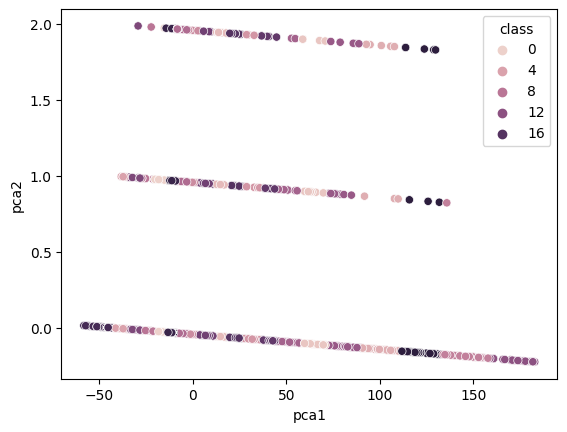

In [106]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=kmeans_pca_df)
plt.plot()

[]

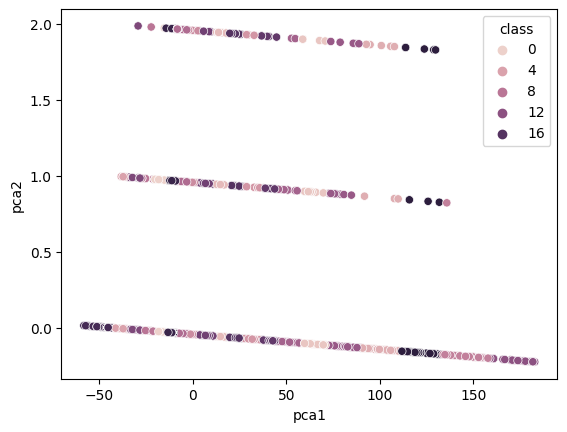

In [107]:
sns.scatterplot(x="pca1", y="pca2", hue='class', data=truth_pca_df)
plt.plot()